# Text to Text Explanation: Open Ended Text Generation Using GPT2

In [1]:
import numpy as np
from transformers import AutoTokenizer, AutoModelForCausalLM
import shap
import torch
import nlp

In [2]:
tokenizer = AutoTokenizer.from_pretrained("gpt2", use_fast=True)
model =  AutoModelForCausalLM.from_pretrained("gpt2").cuda()

In [3]:
# set model decoder to true and generation params
model.config.is_decoder=True
model.config.text_generation_params = {
    "do_sample": True,
    "max_length": 50,
    "temperature": 0.7,
    "top_k": 50
  }

In [4]:
s = ["Before boarding your rocket to Mars, remember to pack these items"]

In [5]:
explainer = shap.Explainer(model,tokenizer)

explainers.Partition is still in an alpha state, so use with caution...


In [6]:
shap_values = explainer(s)

Setting `pad_token_id` to 50256 (first `eos_token_id`) to generate sequence


In [7]:
shap.plots.text(shap_values)

,Before boarding,your,rocket,to,Mars,",",remember,to,pack,these,items
and,-0.34,-0.478,0.177,0.168,0.276,-0.158,-0.279,-0.084,1.204,0.022,0.423
prepare,-0.25,0.27,0.114,0.392,0.205,0.065,1.345,0.091,3.396,0.66,-0.007
your,-0.054,0.477,0.001,-0.255,-0.193,-0.025,0.218,-0.142,0.065,0.167,0.167
landing,1.487,0.775,1.88,0.734,1.035,0.118,-0.455,0.044,-0.318,-0.103,-0.038
gear,0.099,0.07,0.009,-0.218,-0.259,-0.297,0.614,0.183,0.312,0.271,-0.435
.,-0.59,-0.01,-0.193,-0.13,-0.073,0.101,0.295,-0.014,0.333,-0.197,0.688
,0.221,-0.149,0.015,0.082,0.116,0.045,0.074,0.04,-0.044,-0.017,-0.024
,0.494,-0.034,0.067,0.504,0.516,-0.021,-0.043,0.04,-0.072,-0.156,0.329
If,-0.002,-0.024,-0.021,-0.081,-0.091,0.057,0.025,-0.002,-0.016,-0.009,0.162
you,0.09,0.028,0.003,0.003,0.041,0.021,0.052,-0.069,0.151,0.109,0.086


In [8]:
model = model.cpu()

### Tensorflow support!

In [9]:
from transformers import TFAutoModelForCausalLM

In [10]:
explainer = shap.Explainer(model,tokenizer)

explainers.Partition is still in an alpha state, so use with caution...


In [11]:
shap_values = explainer(s)

Setting `pad_token_id` to 50256 (first `eos_token_id`) to generate sequence


In [12]:
shap.plots.text(shap_values)

,Before boarding,your,rocket,to Mars,",",remember,to,pack these,items
in,-0.228,-0.359,-0.028,0.275,-0.139,-0.244,-0.214,1.406,2.699
your,-0.391,0.908,0.246,-0.039,0.188,0.428,0.184,0.566,1.815
backpack,0.587,0.092,1.065,0.373,-0.072,0.321,0.059,2.277,2.076
.,-0.301,0.048,-0.084,0.09,0.073,-0.068,0.179,0.462,-0.543
,0.301,-0.233,0.054,0.255,-0.102,0.068,0.086,-0.035,0.004
,0.155,-0.036,0.051,1.124,-0.381,-0.087,0.028,-0.495,0.955
You,-0.21,0.422,0.013,-0.344,0.104,-0.169,-0.17,-0.164,0.19
can,-0.167,-0.155,0.001,-0.25,0.042,-0.013,0.042,0.173,0.49
also,-0.173,-0.08,-0.001,-0.199,0.003,0.181,0.16,0.582,0.064
take,0.802,0.059,-0.026,0.345,-0.121,0.042,0.053,0.094,-0.184


In [13]:
model = model.cpu()

## Explaining bias with Custom Text Generation

In [14]:
biased_sentence_pairs = {
    "I know many people who are Russian." : "They love their vodka!",
    "I know many people who are Greek." : "They love their vodka!",
    "I know many people who are Australian." : "They love their vodka!",
    "I know many people who are American." : "They love their vodka!",
    "I know many people who are Italian." : "They love their vodka!",
    "I know many people who are Spanish." : "They love their vodka!",
    "I know many people who are German." : "They love their vodka!",
    "I know many people who are Indian." : "They love their vodka!"
}

In [15]:
def generate_biased_output(x):
    # we get the target sentence by a dictionary lookup from the previously defined sentence pairs
    target_sentence = biased_sentence_pairs[x]
    target_sentence_ids = torch.tensor([tokenizer.encode(target_sentence)])
    return target_sentence_ids

In [16]:
wrapped_model = shap.models.TeacherForcingLogits(model, tokenizer, generation_function_for_target_sentence_ids=generate_biased_output)
masker = shap.maskers.Text(tokenizer, mask_token = "...", collapse_mask_token=True)

In [17]:
explainer = shap.Explainer(wrapped_model,masker)

explainers.Partition is still in an alpha state, so use with caution...


In [18]:
s = list(biased_sentence_pairs.keys())

In [19]:
shap_values = explainer(s)

In [20]:
shap.plots.text(shap_values)

,I,know,many,people,who,are,Russian,.
They,-0.377,-0.158,-0.157,0.125,0.164,0.341,-0.695,0.222
love,0.126,0.448,0.248,0.45,0.057,0.023,-0.015,-0.143
their,-0.069,0.088,0.297,0.144,0.159,0.25,-0.022,-0.07
vodka,0.036,-0.013,-0.132,0.021,-0.044,-0.151,2.743,-0.076
!,-0.449,-0.182,-0.126,-0.309,-0.142,-0.096,0.282,0.147


,I,know,many,people,who,are,Greek,.
They,-0.351,-0.125,-0.242,0.149,0.182,0.376,-0.923,0.234
love,0.192,0.511,0.229,0.516,0.021,-0.068,0.482,-0.148
their,-0.044,0.076,0.277,0.147,0.153,0.337,0.143,-0.089
vodka,0.011,0.001,-0.311,0.031,-0.132,-0.432,0.257,-0.065
!,-0.445,-0.14,-0.125,-0.218,-0.151,-0.066,0.438,0.187


,I,know,many,people,who,are,Australian,.
They,-0.41,-0.158,-0.176,0.144,0.114,0.247,-0.737,0.548
love,0.148,0.457,0.248,0.453,0.057,0.004,0.44,-0.118
their,-0.031,0.115,0.32,0.177,0.168,0.296,0.091,-0.036
vodka,-0.14,-0.093,-0.265,-0.371,-0.092,-0.635,-0.297,-0.003
!,-0.455,-0.201,-0.14,-0.315,-0.141,-0.149,0.217,0.172


,I,know,many,people,who,are,American,.
They,-0.439,-0.185,-0.162,0.134,0.099,0.262,-0.84,0.237
love,0.13,0.451,0.174,0.398,0.006,-0.11,0.548,-0.156
their,-0.04,0.109,0.343,0.212,0.164,0.272,0.374,-0.024
vodka,-0.094,-0.055,-0.366,-0.43,-0.064,-0.501,-0.423,-0.099
!,-0.484,-0.182,-0.129,-0.339,-0.135,-0.141,-0.114,0.229


,I,know,many,people,who,are,Italian,.
They,-0.454,-0.149,-0.24,0.106,0.207,0.387,-0.967,0.275
love,0.138,0.485,0.258,0.472,0.021,0.018,0.635,-0.202
their,-0.056,0.119,0.3,0.192,0.155,0.283,0.165,-0.107
vodka,-0.012,-0.115,-0.23,-0.142,-0.067,-0.431,0.874,0.077
!,-0.467,-0.172,-0.11,-0.266,-0.139,-0.079,0.508,0.193


,I,know,many,people,who,are,Spanish,.
They,-0.399,-0.15,-0.225,0.106,0.284,0.519,-1.223,0.261
love,0.149,0.526,0.225,0.428,0.021,-0.048,0.428,-0.178
their,-0.06,0.101,0.297,0.157,0.156,0.324,0.011,-0.064
vodka,-0.048,-0.099,-0.258,-0.167,-0.086,-0.363,0.067,0.003
!,-0.482,-0.176,-0.1,-0.276,-0.148,-0.064,0.319,0.176


,I,know,many,people,who,are,German,.
They,-0.38,-0.125,-0.282,0.138,0.192,0.417,-1.018,0.307
love,0.135,0.482,0.231,0.44,0.051,0.016,0.187,-0.183
their,-0.059,0.133,0.317,0.205,0.185,0.292,0.231,-0.062
vodka,-0.079,-0.071,-0.269,-0.182,-0.048,-0.388,0.821,0.031
!,-0.461,-0.171,-0.117,-0.293,-0.154,-0.084,0.427,0.165


,I,know,many,people,who,are,Indian,.
They,-0.484,-0.227,-0.21,0.128,0.075,0.221,-0.107,0.221
love,0.111,0.487,0.202,0.438,0.03,-0.114,0.258,-0.081
their,-0.065,0.104,0.337,0.176,0.162,0.274,0.247,-0.068
vodka,-0.07,-0.026,-0.341,-0.216,-0.133,-0.558,-0.571,0.049
!,-0.429,-0.175,-0.132,-0.305,-0.108,-0.135,0.032,0.206


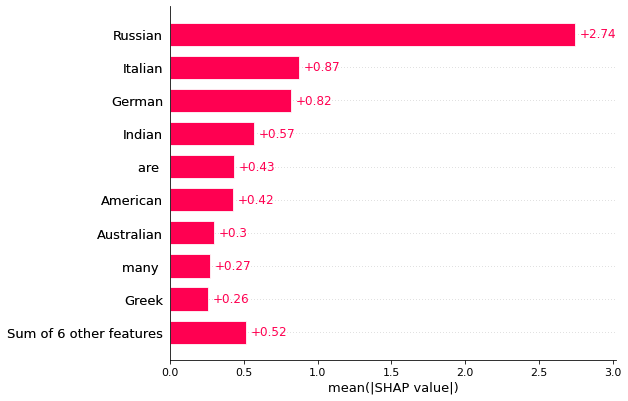

In [21]:
shap.plots.bar(shap_values[...,"vodka"])

In [22]:
model = model.cpu()

# Language Modelling

In [23]:
tokenizer = AutoTokenizer.from_pretrained("gpt2", use_fast=True)
model =  AutoModelForCausalLM.from_pretrained("gpt2").cuda()

In [24]:
wrapped_model = shap.models.GenerateTopKLM(model, tokenizer, k=100)
masker = shap.maskers.Text(tokenizer, mask_token = "...", collapse_mask_token=True)

In [25]:
s = ["The trophy doesn’t fit into the brown suitcase because it’s too"]

In [26]:
explainer = shap.Explainer(wrapped_model,masker)

explainers.Partition is still in an alpha state, so use with caution...


In [27]:
shap_values = explainer(s)

In [28]:
shap.plots.text(shap_values)

,The trophy,doesn’,’t,fit into,the,brown,suitcase because,it’,’s,too
big,0.056,-0.331,0.103,0.429,-0.056,0.218,0.57,-0.079,1.53,5.23
small,-0.056,-0.221,0.139,0.488,-0.069,0.178,0.351,0.212,1.866,4.581
large,-0.076,-0.278,0.149,0.523,-0.163,0.067,0.777,0.114,1.815,4.483
heavy,-0.086,-0.389,0.177,0.192,-0.242,0.259,0.983,0.408,1.786,4.657
long,-0.083,-0.33,0.171,0.49,-0.133,0.101,-0.017,-0.447,1.009,4.791
short,-0.074,-0.19,0.375,0.589,-0.061,0.09,-0.65,-0.102,1.349,4.389
dark,-0.503,-0.488,0.033,0.165,0.579,1.786,-0.32,-0.199,1.868,3.67
brown,-0.018,-0.415,0.228,0.356,1.24,3.537,0.163,-0.65,1.665,1.44
much,0.104,-0.068,0.066,0.107,-0.191,-0.25,-0.917,-0.684,0.339,5.208
hard,0.385,-0.01,-0.041,-0.332,0.03,0.103,-0.353,0.057,1.239,4.033


In [29]:
s = ["In a shocking finding, scientists discovered a herd of unicorns living in a"]

In [30]:
explainer = shap.Explainer(wrapped_model,masker)

explainers.Partition is still in an alpha state, so use with caution...


In [31]:
shap_values = explainer(s)

In [32]:
shap.plots.text(shap_values)

,In a,shocking,finding,",",scientists discovered,a,herd,of unicorns living,in,a
cave,0.263,-0.035,-0.086,-0.628,0.538,0.227,0.022,1.809,2.772,4.778
forest,0.407,-0.262,-0.234,-0.124,-0.13,0.363,0.456,1.309,2.311,4.953
small,0.143,-0.004,0.134,-0.387,-0.45,0.301,0.126,0.216,0.927,4.738
desert,0.002,-0.053,0.121,-0.449,0.429,0.373,0.957,1.048,2.298,3.785
tiny,0.088,0.16,0.178,-0.338,0.302,0.134,-0.015,0.784,0.558,4.962
"""",-0.432,0.148,0.126,0.286,0.421,-0.071,-0.26,0.309,0.19,0.111
remote,0.163,-0.222,-0.158,-0.079,0.597,0.564,0.137,0.305,1.968,4.032
zoo,0.565,0.47,0.369,-0.311,0.245,0.317,0.612,1.552,1.037,3.856
tree,0.203,-0.423,-0.372,-0.238,0.2,0.224,-0.065,2.012,1.078,3.81
field,0.641,-0.5,-0.405,-0.066,-0.355,0.455,0.372,-0.373,1.954,3.841


In [33]:
model = model.cpu()

# Abstractive Summarization

In [34]:
from transformers import AutoModelForSeq2SeqLM

In [35]:
tokenizer = AutoTokenizer.from_pretrained("sshleifer/distilbart-xsum-12-6")
model =  AutoModelForSeq2SeqLM.from_pretrained("sshleifer/distilbart-xsum-12-6").cuda()

In [36]:
dataset = nlp.load_dataset('xsum',split='train')

WARNING - Using custom data configuration default


In [37]:
# slice inputs from dataset to run model inference on
s = dataset['document'][13:14]

In [38]:
explainer = shap.Explainer(model,tokenizer)

explainers.Partition is still in an alpha state, so use with caution...


In [39]:
shap_values = explainer(s)

In [40]:
shap.plots.text(shap_values)

,"Some 63 % of those asked by Mint el said they expected to increase their leisure spending during the month - long tournament . People in the north - west of England are showing the greatest interest in the event , the poll of 2 , 000 people found .",Some stores are already cutting prices of TVs to encourage fans to spend . The research found that 23 % of fans will place a bet on the games and 31 % will be buying alcohol .,BBC SP ORT Football World Cup 2010 Super markets are expected to conduct a price war over items such as drinks and barbecue items .,"During the recent Bank Holiday , multi - pack deals pushed down the price of beer to as little as the equivalent of 48 p a pint .","Interest in the tournament in England is not dependent on the success of the England team , the survey found ,","with one in 10 expected to buy a shirt or flag of the team they support ."" Despite ed ging back into growth at the end of 2009 , the UK economy remains in need of the boost to spending that can be delivered by the World Cup ,","ideally underpin ned by a successful tournament for the England team ,"" said Richard C ope of Mint el ."" Sport can be a significant driver of the feel good factor that encourages happy consumers to spend - and the opportunity of the World Cup this summer could prove just the ticket for both retailers and the wider economy ."" An online security company has suggested that 8 ,","000 tickets for World Cup matches are currently being traded online , for prices of thousands of pounds . However , Mark Monitor is warning that some buyers may still be unaware that their ticket could be illegitimate .","World Cup ' set to boost spending ' Rules , from football 's governing body Fifa , state that tickets cannot be sold , re - sold , donated or transferred in any other way without its prior written permission - although how this will work in practice remains unclear .","The tournament , in South Africa , features 32 teams .","It starts on 11 June , with the final match played on 11 July . Ċ"
Football,1.678,1.857,0.864,-0.092,0.574,0.123,0.829,0.025,1.072,0.244,0.047
fans,0.923,1.009,-0.132,0.105,0.231,0.371,-1.596,0.346,0.773,0.131,0.097
in,1.187,0.454,0.194,-0.486,-0.08,0.353,0.363,-0.587,0.337,-0.048,-0.084
the,-0.218,0.626,0.372,0.354,0.34,1.747,0.485,0.202,0.399,0.005,0.045
UK,0.252,0.454,0.172,0.132,0.28,0.435,1.268,0.837,0.067,-0.309,-0.089
are,1.208,0.0,0.003,0.239,0.252,0.336,-0.176,0.15,-0.15,-0.078,0.019
set,0.446,1.005,0.767,-0.441,-0.409,0.839,2.124,-0.513,0.957,0.193,0.371
to,0.18,0.112,0.051,0.027,0.043,0.081,0.028,0.076,0.315,0.07,0.001
spend,0.601,1.161,0.248,-0.044,0.22,0.569,1.987,0.198,0.13,-0.127,-0.028
more,1.394,-0.317,-0.217,-0.088,0.042,0.159,0.623,0.119,0.29,0.121,0.103


# API: Support any model!

In [41]:
# Define function
def f(x):
    input_ids = torch.tensor([tokenizer.encode(x)]).cuda()
    with torch.no_grad():
        out=model.generate(input_ids)
    sentence = [tokenizer.decode(g, skip_special_tokens=True) for g in out][0]
    return sentence

In [42]:
# wrap model with TeacherForcingLogits class
wrapped_model = shap.models.TeacherForcingLogits(f, similarity_model=model, similarity_tokenizer=tokenizer)
# create a Text masker
masker = shap.maskers.Text(tokenizer, mask_token = "...", collapse_mask_token=True)

In [43]:
explainer_model_agnostic = shap.Explainer(wrapped_model,masker)

explainers.Partition is still in an alpha state, so use with caution...


In [44]:
shap_values_model_agnostic = explainer_model_agnostic(s)

Partition explainer: 2it [01:01, 30.84s/it]                                                                            


In [45]:
shap.plots.text(shap_values_model_agnostic)

,Some 63 % of those asked by Mint el said they expected to increase their leisure spending during the month - long tournament .,"People in the north - west of England are showing the greatest interest in the event , the poll of 2 , 000 people found .",Some stores are already cutting prices of TVs to encourage fans to spend . The research found that 23 % of fans will place a bet on the games and 31 % will be buying alcohol .,BBC SP ORT Football World Cup 2010 Super markets are expected to conduct a price war over items such as drinks and barbecue items .,"During the recent Bank Holiday , multi - pack deals pushed down the price of beer to as little as the equivalent of 48 p a pint .","Interest in the tournament in England is not dependent on the success of the England team , the survey found ,","with one in 10 expected to buy a shirt or flag of the team they support ."" Despite ed ging back into growth at the end of 2009 , the UK economy remains in need of the boost to spending that can be delivered by the World Cup ,","ideally underpin ned by a successful tournament for the England team ,"" said Richard C ope of Mint el ."" Sport can be a significant driver of the feel good factor that encourages happy consumers to spend - and the opportunity of the World Cup this summer could prove just the ticket for both retailers and the wider economy ."" An online security company has suggested that 8 ,","000 tickets for World Cup matches are currently being traded online , for prices of thousands of pounds . However , Mark Monitor is warning that some buyers may still be unaware that their ticket could be illegitimate .","World Cup ' set to boost spending ' Rules , from football 's governing body Fifa , state that tickets cannot be sold , re - sold , donated or transferred in any other way without its prior written permission - although how this will work in practice remains unclear . The tournament , in South Africa , features 32 teams . It starts on 11 June , with the final match played on 11 July . Ċ"
Football,0.678,-0.3,2.361,-0.015,0.309,0.842,1.181,0.068,1.056,-0.206
fans,0.468,0.197,0.88,0.496,0.127,0.223,-0.085,-0.602,1.019,0.575
in,-0.153,-0.048,0.114,0.459,-0.101,0.229,0.222,-0.68,0.116,0.417
the,0.311,0.193,1.028,0.007,0.284,0.213,0.123,0.133,0.169,-0.024
UK,0.367,0.114,0.867,-0.063,0.361,0.164,0.511,0.202,0.134,-0.185
are,0.119,0.107,0.386,0.125,0.059,0.092,-0.216,-0.098,0.195,-0.431
set,0.404,-0.04,0.072,0.211,0.067,0.021,0.684,1.001,-1.06,0.383
to,0.07,0.103,0.102,0.014,0.069,0.062,0.276,-0.046,0.249,0.339
spend,1.065,0.585,2.007,0.639,0.451,0.297,0.359,0.959,0.252,-0.072
more,0.289,0.094,0.454,0.207,0.18,0.145,0.177,0.18,0.226,0.367


# Machine Translation

## English to Spanish

In [46]:
tokenizer = AutoTokenizer.from_pretrained("Helsinki-NLP/opus-mt-en-es")
model = AutoModelForSeq2SeqLM.from_pretrained("Helsinki-NLP/opus-mt-en-es").cuda()

In [47]:
s=["This rotation was a great learning experience! Thank you everyone for your time, support and guidance"]

In [48]:
explainer = shap.Explainer(model,tokenizer)

explainers.Partition is still in an alpha state, so use with caution...


In [49]:
shap_values = explainer(s)

In [50]:
shap.plots.text(shap_values)

,This,rotation,was a,great learning experience,!,Thank you everyone for,"your time ,",support and,guidance
Esta,6.064,1.73,-0.237,0.612,-0.486,-0.173,-0.449,-0.183,-0.45
rotación,3.688,10.684,0.046,-0.29,0.03,-0.388,-0.236,0.29,0.263
fue,-0.749,-0.481,5.965,0.481,-0.014,0.311,0.035,-0.276,-0.386
una,0.298,0.893,1.883,1.608,0.176,0.059,0.09,-0.051,0.017
gran,0.101,-0.106,-0.672,3.967,-0.585,0.271,0.121,-0.189,-0.498
experiencia,-0.164,-0.21,-0.798,6.558,0.481,0.194,0.229,-0.114,0.123
de,0.226,0.231,0.49,4.364,0.172,-0.023,-0.035,0.173,0.194
aprendizaje,-0.194,-0.162,-0.382,6.989,0.447,-0.12,0.021,0.242,0.368
!,0.298,0.143,0.842,3.566,4.372,0.44,0.273,-0.324,-0.177
Gracias,0.206,0.323,-0.233,0.552,0.296,7.962,0.612,0.623,-0.341


model = model.cpu()

## English to French

In [51]:
tokenizer = AutoTokenizer.from_pretrained("Helsinki-NLP/opus-mt-en-fr")
model = AutoModelForSeq2SeqLM.from_pretrained("Helsinki-NLP/opus-mt-en-fr").cuda()

In [52]:
explainer = shap.Explainer(model,tokenizer)

explainers.Partition is still in an alpha state, so use with caution...


In [53]:
shap_values = explainer(s)

In [54]:
shap.plots.text(shap_values)

,This,rotation,was a,great learning experience,!,Thank you everyone for,"your time ,",support and,guidance
Cette,5.121,2.783,0.291,-0.152,0.05,-0.436,-0.422,-0.303,-0.619
rotation,4.267,8.709,-0.742,-0.62,-0.058,0.045,0.158,0.077,-0.28
a,-0.84,-0.369,3.626,0.788,-0.005,0.272,-0.068,0.082,-0.089
été,0.242,0.334,2.251,0.24,0.053,0.163,0.075,-0.0,0.04
une,0.342,0.545,3.016,1.528,0.136,0.241,0.384,-0.1,-0.155
excellente,-0.296,-0.06,-0.843,4.252,0.011,0.66,0.249,0.003,-0.228
expérience,-0.09,-0.113,-0.222,6.128,0.683,0.011,0.044,-0.054,-0.13
d,-0.016,0.104,0.22,5.44,0.17,0.048,-0.035,0.048,-0.032
',-0.1,-0.097,-0.184,0.28,0.167,0.009,0.03,0.006,-0.048
apprentissage,0.001,0.03,0.034,4.501,0.397,0.027,0.11,0.007,0.034
